In [1]:
import numpy as np
import matplotlib.pyplot as plt


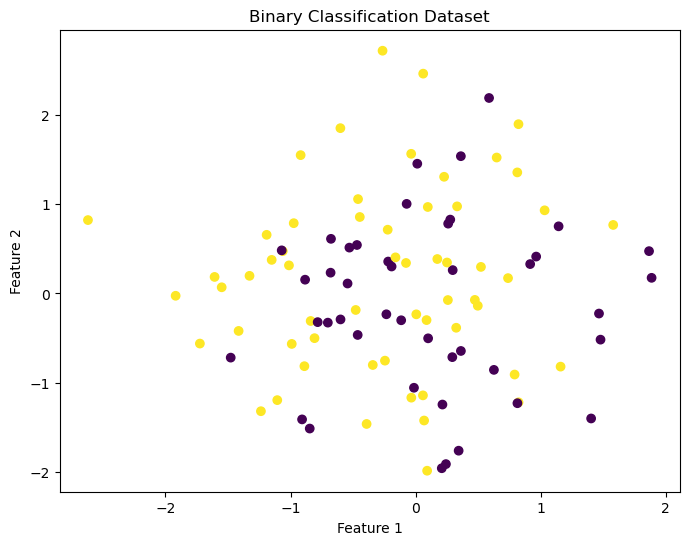

In [2]:
# Generate a random binary classification dataset
np.random.seed(42)
X = np.random.randn(100, 2)
y = np.random.randint(0, 2, size=100)

# Plot the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
plt.title('Binary Classification Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


In [3]:
# Split the dataset into train and test sets
X_train, X_test = X[:80], X[80:]
y_train, y_test = y[:80], y[80:]

# Add bias term to the features (X)
X_train_bias = np.c_[np.ones((X_train.shape[0], 1)), X_train]
X_test_bias = np.c_[np.ones((X_test.shape[0], 1)), X_test]

In [4]:
class SingleLayerPerceptron:
    def __init__(self, learning_rate=0.01, n_iterations=100):
        self.learning_rate = learning_rate
        self.n_iterations = n_iterations

    def fit(self, X, y):
        self.weights = np.zeros(X.shape[1])
        self.errors = []

        for _ in range(self.n_iterations):
            error = 0
            for xi, target in zip(X, y):
                update = self.learning_rate * (target - self.predict(xi))
                self.weights += update * xi
                error += int(update != 0.0)
            self.errors.append(error)
            if error == 0:
                break  # If there are no errors, stop training
            elif error == len(X):
                print("Model did not converge. Increase the number of iterations or change the learning rate.")
                break  # If all examples are misclassified, stop training to prevent infinite loop.
    
    def predict(self, X):
        print("Weights:", self.weights)
        print("Dot product:", np.dot(X, self.weights))
        print("Thresholded dot product:", np.where(np.dot(X, self.weights) >= 0, 1, 0))
        return np.where(np.dot(X, self.weights) >= 0, 1, 0)


In [9]:
# Train the Single Layer Perceptron
slp = SingleLayerPerceptron(learning_rate=0.1, n_iterations=1000)
slp.fit(X_train_bias, y_train)




Weights: [0. 0. 0.]
Dot product: 0.0
Thresholded dot product: 1
Weights: [0. 0. 0.]
Dot product: 0.0
Thresholded dot product: 1
Weights: [0. 0. 0.]
Dot product: 0.0
Thresholded dot product: 1
Weights: [-0.1         0.02341534  0.0234137 ]
Dot product: -0.045053715770162275
Thresholded dot product: 0
Weights: [0.         0.18133662 0.10015717]
Dot product: -0.03079162009677567
Thresholded dot product: 0
Weights: [0.         0.18133662 0.10015717]
Dot product: -0.1306807710652121
Thresholded dot product: 0
Weights: [0.         0.18133662 0.10015717]
Dot product: -0.1477521118058457
Thresholded dot product: 0
Weights: [0.         0.18133662 0.10015717]
Dot product: -0.36910789471412614
Thresholded dot product: 0
Weights: [0.1        0.00884484 0.04392842]
Dot product: 0.10484606253060173
Thresholded dot product: 1
Weights: [0.1        0.00884484 0.04392842]
Dot product: 0.02992841210791134
Thresholded dot product: 1
Weights: [0.         0.09964724 0.18515879]
Dot product: 0.10424339383914

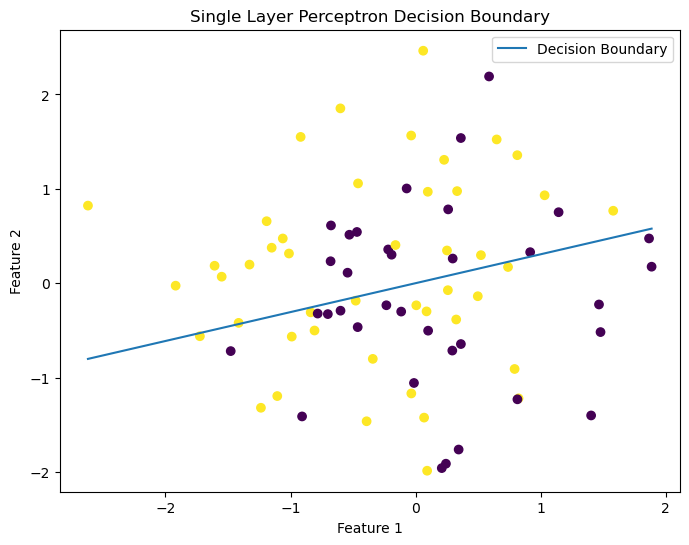

In [10]:
# Plot the decision boundary
x_values = np.array([np.min(X_train[:, 0]), np.max(X_train[:, 0])])
y_values = -(slp.weights[0] + slp.weights[1] * x_values) / slp.weights[2]

plt.figure(figsize=(8, 6))
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis')
plt.plot(x_values, y_values, label='Decision Boundary')
plt.title('Single Layer Perceptron Decision Boundary')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

In [11]:
# Make predictions on the test set
y_pred = slp.predict(X_test_bias)

# Print predictions for debugging
print("Predictions:", y_pred)

# Calculate accuracy
accuracy = np.mean(y_pred == y_test)
print("Accuracy:", accuracy)

# Print weights for debugging
print("Weights:", slp.weights)


Weights: [ 0.         -0.02430465  0.07933693]
Dot product: [ 0.08613417 -0.09326967  0.00933426  0.13050585 -0.05383504 -0.04310455
  0.02893988  0.05890131  0.11500293  0.22224226 -0.08321087  0.06430554
  0.06207779 -0.0172799  -0.09960231  0.07879644 -0.10403656  0.0263608
  0.03367792 -0.0920945 ]
Thresholded dot product: [1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 1 0]
Predictions: [1 0 1 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 1 0]
Accuracy: 0.5
Weights: [ 0.         -0.02430465  0.07933693]
